<a href="https://colab.research.google.com/github/alessiobocco/Diplo_Eco/blob/main/Analisis_Exploratorio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Estructura de Informe (7 pág máx - todo dentro de las 7 con graficos, etc.):
escueto,intro, resultados por bullets.
Teenr en cuenta los puntos solicitados en el informe.
1. Exploración de datos, visualización.(lo importante)
2. Limpieza de datos (Decisiones tomadas al respecto - eliminar outliers, crear nuevas variables, eliminar registros, descarte de columnas, reemplazo o eliminación de nulos, etc)
3. Como encaramos el problema y como se prepararon los datos para resolver el problema.
4. Que modelo aplicamos (en el script quedan los pasos intermedios, pero solo agregar el final,se puede comentar los pasos)
5. Resultados y conclusiones.

# Analisis exploratorio

In [5]:
# Paquetes requeridos
!pip install geopy
!pip install geopandas
!pip install pandas_profiling
!pip install folium
!pip install chardet

  Using cached pandas_profiling-3.1.0-py2.py3-none-any.whl (261 kB)
  Using cached joblib-1.0.1-py3-none-any.whl (303 kB)
  Using cached missingno-0.5.0-py3-none-any.whl (8.8 kB)
  Using cached phik-0.12.0-cp39-cp39-macosx_10_13_x86_64.whl (653 kB)
  Using cached multimethod-1.6-py3-none-any.whl (9.4 kB)
  Using cached htmlmin-0.1.12-py3-none-any.whl
  Using cached tangled_up_in_unicode-0.1.0-py3-none-any.whl (3.1 MB)
  Using cached pydantic-1.8.2-cp39-cp39-macosx_10_9_x86_64.whl (2.7 MB)
  Using cached visions-0.7.4-py3-none-any.whl (102 kB)
  Using cached ImageHash-4.2.1-py2.py3-none-any.whl
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 1.1.1
    Uninstalling MarkupSafe-1.1.1:
      Successfully uninstalled MarkupSafe-1.1.1
  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.0
    Uninstalling joblib-1.1.0:
      Successfully uninstalled joblib-1.1.0
ERROR: pip's dependency resolver does not currently take into account all the p

In [6]:
# Modulos generales
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from pandas_profiling import ProfileReport
import os.path
import geopandas as gpd
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster
from folium import plugins
from IPython.display import display

# helpful character encoding module
import chardet
import missingno as msno

%matplotlib inline

/Users/alessiobocco/opt/anaconda3/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [7]:
data = pd.read_csv("https://raw.githubusercontent.com/alessiobocco/Diplo_Eco/main/data/precio_locales_CABA.csv", encoding = 'utf-8')

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3711 entries, 0 to 3710
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 3711 non-null   int64  
 1   antig              3711 non-null   int64  
 2   m2total            3711 non-null   int64  
 3   m2cub              3711 non-null   int64  
 4   ambientes          3711 non-null   int64  
 5   banios             3711 non-null   int64  
 6   direccion          3707 non-null   object 
 7   barrio             3711 non-null   object 
 8   comuna             3711 non-null   int64  
 9   latitud            3711 non-null   float64
 10  longitud           3711 non-null   float64
 11  precioUSD          3711 non-null   int64  
 12  m2precioUSD        3711 non-null   float64
 13  comisaria_dista    3711 non-null   float64
 14  obelisco_dista     3711 non-null   float64
 15  nrobos             3711 non-null   int64  
 16  sup_espacio_verde  3711 

Se trabaja con un data set de 19 variables, se observa que la base a utilizar no posee gran cantidad de datos nulos. Las variables están bien catalogadas como float, int y object respetando la naturaleza de las variables.


In [9]:
data.head()

,id,antig,m2total,m2cub,ambientes,banios,direccion,barrio,comuna,latitud,longitud,precioUSD,m2precioUSD,comisaria_dista,obelisco_dista,nrobos,sup_espacio_verde,count_gastronomia,count_culturales
0,1,0,200,200,0,0,Gral Paz y Rivadavia,LINIERS,9,-34.639300,-58.528647,1500000,7500.000000,1162.621600,14053.797191,134,68426.445,12,0
1,2,30,50,50,0,1,Asuncion,VILLA DEVOTO,11,-34.611807,-58.528138,125000,2500.000000,1887.227055,13473.139375,23,110997.543,3,0
2,3,30,414,414,0,2,Avenida Beiro 5574,VILLA REAL,10,-34.616468,-58.528111,590000,1425.120773,1497.020434,13514.662463,33,115341.039,5,0
3,4,35,414,414,0,2,Avenida Beiro 5574,VILLA REAL,10,-34.616344,-58.527918,730000,1763.000000,1506.066814,13495.631683,33,115500.289,5,0
4,5,35,285,285,0,1,Avenida Beiro 5574,VILLA REAL,10,-34.616344,-58.527918,550000,1929.000000,1506.066814,13495.631683,33,115500.289,5,0


### Profiling

In [10]:
#ProfileReport(data)

### Faltantes

<AxesSubplot:>

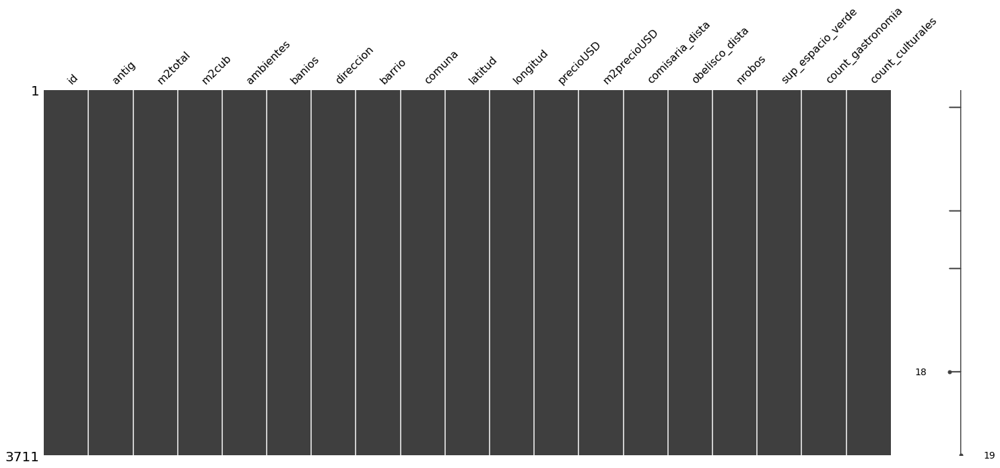

In [11]:
msno.matrix(data)

### Convertir a datos espaciales

In [12]:
# Convertir base de datos de locales a geodataframe
geo_data = gpd.GeoDataFrame(
    data, geometry = gpd.points_from_xy(data.longitud, data.latitud, crs = 4326)).to_crs(epsg=3857)

In [13]:
# Obtener coordenadas planares
geo_data['lon_planar'] = geo_data['geometry'].x
geo_data['lat_planar'] = geo_data['geometry'].y

### Corrección de direciones

In [14]:
def get_address(lat, lon, language="es", full_address = True):
    """
    Argumentos de la función
    lat: latitd del punto medida en grados decimales.
    lon: longitud del punto medida en grados decimales.
    language: idioma en el que se devuelven los resultados. He probado solo en y es.
    full_address: devuelve la dirección con todos los atributos o sólo la calle y altura. 
    """
    try:
            geolocator = Nominatim(user_agent = 'Diplo')
            reverse = RateLimiter(geolocator.reverse, min_delay_seconds=1)
            string = str(lat) + ', ' + str(lon)
            location = reverse(string, language=language)
            data = location.raw
            data = data['address']

            if full_address:
                # Crear objetos para guardar resultados
                street = house_number = district = postalCode = state = country = countryCode = "-9999"
                # Variables intermedias
                # No todas las direcciones tienen todos los datos. Ahora le voy a poner un if
                # para comprobar las keys del diccionario que devuelve OSM. 
                # TO-DO: buscar una alternativa más elegante a este problema. No tengo claro
                # si el problema es con una sola key o con varias. Si no está presente la clave
                # le pongo -9999 a la variable asi la identifico facilmente. 
                # Eliminamos la comuna porque hay claves diferentes para algunas direcciones. 
                # A veces esta como state_district y otra como city_district
                
                # Calles 
                if 'road' in data.keys():
                    street         = data.get('road')
                # Número 
                if 'house_number' in data.keys():
                    house_number   = data.get('house_number')
                # Barrio 
                if 'suburb' in data.keys():
                    district       = data.get('suburb')
                # Comuna 
                #if 'state_district' in data.keys():
                #    state_district = data.get('state_district')
                # Ciudad 
                if 'city' in data.keys():
                    city           = data.get('city')
                # Codigo postal 
                if 'postcode' in data.keys():
                    postalCode     = data.get('postcode')
                # Provincia. Unidad adm. 2 
                if 'state' in data.keys():
                    state          = data.get('state')
                # País. Unidad adm 1 
                if 'country' in data.keys():
                    country        = data.get('country')
                # Codigo de país 
                if 'country_code' in data.keys():
                    countryCode    = data.get('country_code').upper()
                address = street +'; '+ house_number +'; '+ district  + ';'  + city  + '; ' + postalCode  +'; '+  state  +'; '+  country  +'; '+  countryCode
            else:
                # Crear objetos para guardar resultados
                street = house_number = "-9999"
                # Variables intermedias
                # Calles 
                if 'road' in data.keys():
                    street         = data.get('road')
                # Número 
                if 'house_number' in data.keys():
                    house_number   = data.get('house_number')
                address = street +';'+ house_number
    except:
            address = "Error"
    return str(address)

In [15]:
if not os.path.isfile("./data/coordinates.csv"):
    from geopy.geocoders import Nominatim
    from geopy.extra.rate_limiter import RateLimiter
    
    coordinates = data[['id', 'latitud', 'longitud']].copy()
    # Iterar por par coordenado y obtener direcciones
    for i in range(len(coordinates)):
        coordinates.loc[i, 'geocodes'] = get_address(lat = coordinates.latitud[i], lon = coordinates.longitud[i], full_address = False)
    # Guardar resultados
    coordinates.to_csv("./data/coordinates.csv")
else:
    coordinates = pd.read_csv("./data/coordinates.csv",  index_col=[0])
    
# Separar geocode en las distintintas variables
direcciones = coordinates["geocodes"].str.split(";", n = 1, expand = True)
coordinates["calle"] = direcciones[0]
coordinates["altura"] = direcciones[1]
coordinates = coordinates.drop('geocodes', axis = 1)
coordinates.head()

,id,latitud,longitud,calle,altura
0,1,-34.639300,-58.528647,Avenida Rivadavia,11674
1,2,-34.611807,-58.528138,Avenida Lope de Vega,3500
2,3,-34.616468,-58.528111,Avenida Francisco Beiró,-9999
3,4,-34.616344,-58.527918,Avenida Francisco Beiró,-9999
4,5,-34.616344,-58.527918,Avenida Francisco Beiró,-9999


In [16]:
# Ejemplo
get_address(lat = -34.594745, lon = -58.502212, full_address = False)

'Error'

In [17]:
geo_data = geo_data.drop('direccion', axis = 1)

In [18]:
# Agregar variables corregidas
geo_data = pd.merge(geo_data, coordinates, on = ['id', 'latitud', 'longitud'])
geo_data.head()

,id,antig,m2total,m2cub,ambientes,banios,barrio,comuna,latitud,longitud,...,obelisco_dista,nrobos,sup_espacio_verde,count_gastronomia,count_culturales,geometry,lon_planar,lat_planar,calle,altura
0,1,0,200,200,0,0,LINIERS,9,-34.639300,-58.528647,...,14053.797191,134,68426.445,12,0,POINT (-6515379.181 -4114970.854),-6.515379e+06,-4.114971e+06,Avenida Rivadavia,11674
1,2,30,50,50,0,1,VILLA DEVOTO,11,-34.611807,-58.528138,...,13473.139375,23,110997.543,3,0,POINT (-6515322.519 -4111251.605),-6.515323e+06,-4.111252e+06,Avenida Lope de Vega,3500
2,3,30,414,414,0,2,VILLA REAL,10,-34.616468,-58.528111,...,13514.662463,33,115341.039,5,0,POINT (-6515319.514 -4111882.057),-6.515320e+06,-4.111882e+06,Avenida Francisco Beiró,-9999
3,4,35,414,414,0,2,VILLA REAL,10,-34.616344,-58.527918,...,13495.631683,33,115500.289,5,0,POINT (-6515298.029 -4111865.284),-6.515298e+06,-4.111865e+06,Avenida Francisco Beiró,-9999
4,5,35,285,285,0,1,VILLA REAL,10,-34.616344,-58.527918,...,13495.631683,33,115500.289,5,0,POINT (-6515298.029 -4111865.284),-6.515298e+06,-4.111865e+06,Avenida Francisco Beiró,-9999


In [19]:
geo_data.shape

(3711, 23)

### Corrección de comunas

In [20]:
# Descargar geojson de la base de datos del gobierno de CABA
url = "https://cdn.buenosaires.gob.ar/datosabiertos/datasets/comunas/CABA_comunas.geojson"
comunas = gpd.read_file(url).to_crs(epsg=3857)
# Elegir las columnas de interes
comunas = comunas[["COMUNAS", "geometry"]]
# Corregir nombres de variables
comunas = comunas.rename(columns = {"COMUNAS" : "comunas"})
# Eliminar los decimales del string y quedarnos solo con el numero de comuna
comunas['comunas'] = comunas['comunas'].str.split('.').str[0]
# Mostrar resultados 
comunas.head()

,comunas,geometry
0,2,"MULTIPOLYGON (((-6498832.305 -4105601.500, -64..."
1,6,"MULTIPOLYGON (((-6504465.288 -4110607.810, -65..."
2,10,"MULTIPOLYGON (((-6510891.933 -4112381.515, -65..."
3,11,"MULTIPOLYGON (((-6512010.413 -4109163.513, -65..."
4,12,"MULTIPOLYGON (((-6512558.826 -4108823.882, -65..."


In [21]:
geo_data = geo_data.sjoin(comunas, how="left")
geo_data = geo_data.drop(['index_right', 'comuna'], axis = 1)

In [22]:
geo_data.shape

(3711, 23)

### Corrección de barrios

In [23]:
# Descargar geojson de la base de datos del gobierno de CABA
url = "https://cdn.buenosaires.gob.ar/datosabiertos/datasets/barrios/barrios.geojson"
barrios = gpd.read_file(url).to_crs(epsg=3857)
# Elegir las columnas de interes
barrios = barrios[["BARRIO", "geometry"]]
# Corregir nombres de variables
barrios = barrios.rename(columns = {"BARRIO" : "barrios"})
# Mostrar resultados 
barrios.head()

,barrios,geometry
0,CHACARITA,"MULTIPOLYGON (((-6506938.163 -4109112.260, -65..."
1,PATERNAL,"MULTIPOLYGON (((-6508358.240 -4109189.214, -65..."
2,VILLA CRESPO,"MULTIPOLYGON (((-6503702.432 -4109360.911, -65..."
3,VILLA DEL PARQUE,"MULTIPOLYGON (((-6511590.172 -4111665.262, -65..."
4,ALMAGRO,"MULTIPOLYGON (((-6502490.948 -4111563.952, -65..."


In [24]:
geo_data = geo_data.sjoin(barrios, how="left")
geo_data = geo_data.drop(['index_right', 'barrio'], axis = 1)

### Información radio censal

In [25]:
url = "https://cdn.buenosaires.gob.ar/datosabiertos/datasets/informacion-censal-por-radio/caba_radios_censales.geojson"
censo = gpd.read_file(url).to_crs(epsg=3857)
# Elegir las columnas de interes
censo = censo[["CO_FRAC_RA", "TOTAL_POB", "T_HOGAR", "geometry"]]
# Corregir nombres de variables
censo = censo.rename(columns = {"CO_FRAC_RA" : "codigo_fraccion", "TOTAL_POB" : "total_poblacion", "T_HOGAR" : "total_viviendas"})
# Convertir strings a numerico
censo['total_poblacion'] = censo['total_poblacion'].astype(int)
censo['total_viviendas'] = censo['total_viviendas'].astype(int)
# Calculo de area y densidad poblacional
censo["area_m2"] = censo['geometry'].area # Area en m2. La unidad del CRS
censo["area_km2"] = censo.area.values/10**6 # Area en km2
censo["densidad_poblacional"] = censo['total_poblacion']/censo['area_km2']
censo["densidad_viviendas"] = censo['total_viviendas']/censo['area_km2']
# Eliminar variable innecesarias
censo = censo.drop(["area_m2", "area_km2"], axis = 1)
# Mostrar resultados 
censo.head()

,codigo_fraccion,total_poblacion,total_viviendas,geometry,densidad_poblacional,densidad_viviendas
0,1_1_1,336,65,"MULTIPOLYGON (((-6497995.837 -4108511.565, -64...",126.275896,24.428373
1,1_12_1,341,116,"MULTIPOLYGON (((-6499557.935 -4110194.765, -64...",12413.455207,4222.758956
2,1_12_10,296,101,"MULTIPOLYGON (((-6498763.219 -4110309.059, -64...",4507.394707,1537.996167
3,1_12_11,528,136,"MULTIPOLYGON (((-6497487.260 -4110354.513, -64...",974.021405,250.884301
4,1_12_2,229,129,"MULTIPOLYGON (((-6499403.236 -4110183.741, -64...",8427.877537,4747.581669


In [26]:
# La fraccion censal es demasiado pequeña y no todas tienen locales en venta dentro de ellas
# Por tal motivo se prefiere trabajar con barrios
censo = barrios.sjoin(censo, how = 'left')
censo = censo.groupby(['barrios'], as_index=False).agg({"total_poblacion": "sum", "total_viviendas": "sum"})
censo = pd.merge(barrios, censo)
# Calculo de area y densidad poblacional
censo["area_m2"] = censo['geometry'].area # Area en m2. La unidad del CRS
censo["area_km2"] = censo.area.values/10**6 # Area en km2
censo["densidad_poblacional"] = censo['total_poblacion']/censo['area_km2']
censo["densidad_viviendas"] = censo['total_viviendas']/censo['area_km2']
# Eliminar variable innecesarias
censo = censo.drop(["area_m2", "area_km2", 'barrios', 'total_poblacion', 'total_viviendas'], axis = 1)

In [27]:
geo_data = geo_data.sjoin(censo, how="left")
geo_data = geo_data.drop(['index_right'], axis = 1)

In [28]:
geo_data.shape

(3711, 25)

In [29]:
geo_data.head()

,id,antig,m2total,m2cub,ambientes,banios,latitud,longitud,precioUSD,m2precioUSD,...,count_culturales,geometry,lon_planar,lat_planar,calle,altura,comunas,barrios,densidad_poblacional,densidad_viviendas
0,1,0,200,200,0,0,-34.639300,-58.528647,1500000,7500.000000,...,0,POINT (-6515379.181 -4114970.854),-6.515379e+06,-4.114971e+06,Avenida Rivadavia,11674,9,LINIERS,9162.535077,3428.444997
1,2,30,50,50,0,1,-34.611807,-58.528138,125000,2500.000000,...,0,POINT (-6515322.519 -4111251.605),-6.515323e+06,-4.111252e+06,Avenida Lope de Vega,3500,11,VILLA DEVOTO,8847.779056,3215.839159
2,3,30,414,414,0,2,-34.616468,-58.528111,590000,1425.120773,...,0,POINT (-6515319.514 -4111882.057),-6.515320e+06,-4.111882e+06,Avenida Francisco Beiró,-9999,10,VILLA REAL,8773.980909,3209.091367
3,4,35,414,414,0,2,-34.616344,-58.527918,730000,1763.000000,...,0,POINT (-6515298.029 -4111865.284),-6.515298e+06,-4.111865e+06,Avenida Francisco Beiró,-9999,10,VILLA REAL,8773.980909,3209.091367
4,5,35,285,285,0,1,-34.616344,-58.527918,550000,1929.000000,...,0,POINT (-6515298.029 -4111865.284),-6.515298e+06,-4.111865e+06,Avenida Francisco Beiró,-9999,10,VILLA REAL,8773.980909,3209.091367


### Distritos económicos

In [30]:
url = "https://cdn.buenosaires.gob.ar/datosabiertos/datasets/distritos-economicos/distritos_economicos.geojson"
distritos = gpd.read_file(url).to_crs(epsg=3857)
# Elegir las columnas de interes
distritos = distritos[["NOMBRE", "geometry"]]
# Corregir nombres de variables
distritos = distritos.rename(columns = {"NOMBRE" : "distritos"})
# Corregir caracteres especiales
distritos['distritos'] = distritos['distritos'].str.replace('DISE�O','DISEÑO')

distritos.head()

,distritos,geometry
0,DISTRITO DEL DEPORTE,"MULTIPOLYGON (((-6503733.846 -4118050.110, -65..."
1,DISTRITO TECNOLOGICO,"MULTIPOLYGON (((-6502894.471 -4117400.723, -65..."
2,DISTRITO AUDIOVISUAL,"MULTIPOLYGON (((-6505405.458 -4106428.575, -65..."
3,DISTRITO DE LAS ARTES,"MULTIPOLYGON (((-6497456.947 -4116437.168, -64..."
4,DISTRITO DE DISEÑO,"MULTIPOLYGON (((-6497456.947 -4116437.168, -64..."


<AxesSubplot:>

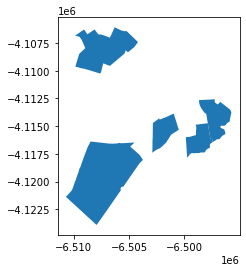

In [31]:
distritos.plot()

In [32]:
geo_data = geo_data.sjoin(distritos, how="left")
geo_data = geo_data.drop(['index_right'], axis = 1)

In [33]:
geo_data.shape

(3711, 26)

In [34]:
geo_data.head()

,id,antig,m2total,m2cub,ambientes,banios,latitud,longitud,precioUSD,m2precioUSD,...,geometry,lon_planar,lat_planar,calle,altura,comunas,barrios,densidad_poblacional,densidad_viviendas,distritos
0,1,0,200,200,0,0,-34.639300,-58.528647,1500000,7500.000000,...,POINT (-6515379.181 -4114970.854),-6.515379e+06,-4.114971e+06,Avenida Rivadavia,11674,9,LINIERS,9162.535077,3428.444997,NaN
1,2,30,50,50,0,1,-34.611807,-58.528138,125000,2500.000000,...,POINT (-6515322.519 -4111251.605),-6.515323e+06,-4.111252e+06,Avenida Lope de Vega,3500,11,VILLA DEVOTO,8847.779056,3215.839159,NaN
2,3,30,414,414,0,2,-34.616468,-58.528111,590000,1425.120773,...,POINT (-6515319.514 -4111882.057),-6.515320e+06,-4.111882e+06,Avenida Francisco Beiró,-9999,10,VILLA REAL,8773.980909,3209.091367,NaN
3,4,35,414,414,0,2,-34.616344,-58.527918,730000,1763.000000,...,POINT (-6515298.029 -4111865.284),-6.515298e+06,-4.111865e+06,Avenida Francisco Beiró,-9999,10,VILLA REAL,8773.980909,3209.091367,NaN
4,5,35,285,285,0,1,-34.616344,-58.527918,550000,1929.000000,...,POINT (-6515298.029 -4111865.284),-6.515298e+06,-4.111865e+06,Avenida Francisco Beiró,-9999,10,VILLA REAL,8773.980909,3209.091367,NaN


In [35]:
geo_data['distritos'] = geo_data.distritos.fillna("NO CARACTERIZADO")

Los distritos que no están definidos por el GCBA se clasifican como "NO CARACTERIZADO"

### Análisis univariado

#### Antiguedad

Text(0.5, 1.0, 'Boxplot')

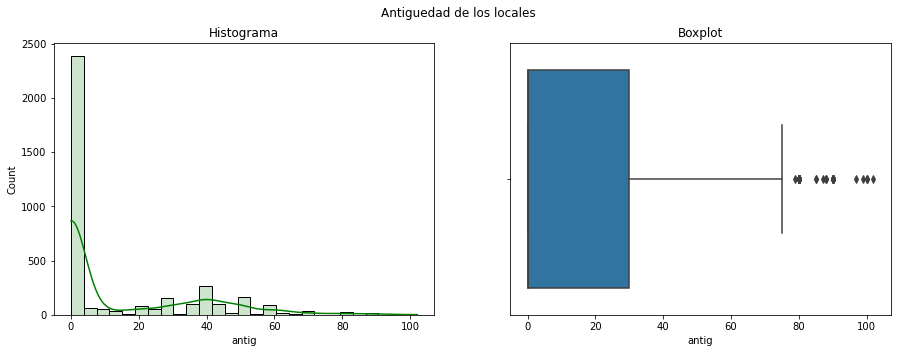

In [36]:

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Antiguedad de los locales')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['antig'], color='g', alpha = 0.2, kde = True)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x=geo_data['antig'])
axes[1].set_title("Boxplot")


#### Superficie total

Text(0.5, 1.0, 'Boxplot')

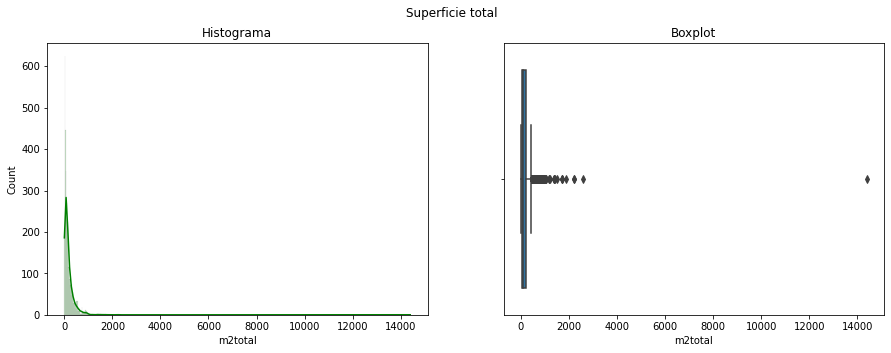

In [113]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Superficie total')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['m2total'], color='g', alpha = 0.2, kde = True)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x=geo_data['m2total'])
axes[1].set_title("Boxplot")

In [114]:
#identificamos los outliers como aquella superficie por encima del percentil definido
percentil = .99
outlier_id = geo_data.m2total.quantile(percentil, interpolation = 'midpoint')
print("El percentil ", percentil, " corresponde a ", outlier_id)
outliers_superficie = geo_data[geo_data.m2total >= (outlier_id)]
print("La cantidad de locales considerados outliers son: ", outliers_superficie.shape[0])

El percentil  0.99  corresponde a  900.0
La cantidad de locales considerados outliers son:  41


In [115]:
def ubicacion_outliers(data, tiles='OpenStreetMap', zoom_start = 11):
    # Creación de mapa base centrado en la primera observacion
    mapa = folium.Map(location=[data.iloc[0]['latitud'], data.iloc[0]['longitud']], tiles=tiles, zoom_start = zoom_start)
    # Agregar demás observaciones a partir de un data frame
    for index, row in data.iterrows():
        Marker((row['latitud'], row['longitud']),
              icon=folium.Icon(color='red'),
              popup= "id: " + str(row['id'])).add_to(mapa)
    # Plotear mapa
    display(mapa)

In [116]:
ubicacion_outliers(data = outliers_superficie)

In [119]:
# Se filtran las superficies consideradas como outliers
geo_data = geo_data[geo_data['m2total'] < outlier_id]

In [120]:
#Se crea una función para normalizar columnas con el método IQR
def normalize (df):
    Q1 = df.quantile(0.25, interpolation = 'midpoint')
    Q3 = df.quantile(0.75, interpolation = 'midpoint')
    IQR = Q3 - Q1
    print( "Old Shape: ", df.shape)
 
    # Upper bound
    upper = np.where(df >= (Q3+1.5*IQR))
    # Lower bound
    lower = np.where(df <= (Q1-1.5*IQR))
 
    ''' Removing the Outliers '''
    df.drop(upper[0], inplace = True)
    df.drop(lower[0], inplace = True)
 
    print("New Shape: ", df.shape)

In [121]:
#Vemos que m2total tiene valores en 0
(geo_data["m2total"] == 0).value_counts()

False    3618
True       52
Name: m2total, dtype: int64

La variable posee valores de 0 lo que es ilógico. Si los datos de superficie cubierta están disponibles para esa propiedad se reemplazarán. Una imputación podría ser riesgosa y sería el último recurso. 

In [122]:
# Los valores iguales a 0 de superficie se total son corregidos con la superficie cubierta
geo_data.loc[(geo_data['m2total'] == 0) & (geo_data['m2cub'] != 0),  'm2total'] = geo_data["m2cub"]

Text(0.5, 1.0, 'Boxplot')

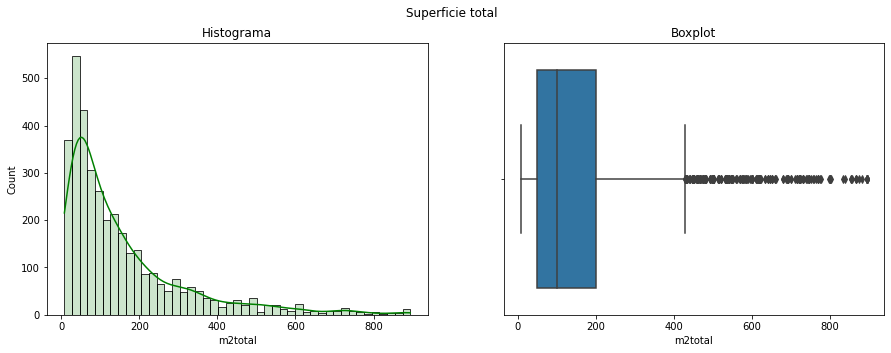

In [123]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Superficie total')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['m2total'], color='g', alpha = 0.2, kde = True)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['m2total'])
axes[1].set_title("Boxplot")

#### Metros cuadrados cubiertos

In [124]:
#Hay datos con m2cub mayores a m2total (seguir viendo)
(geo_data["m2cub"] > geo_data["m2total"]).value_counts()

False    3644
True       26
dtype: int64

In [125]:
# Los metros cubiertos no pueden superar los totales. 
# Se asume que en los casos donde suceda, se corrigen con la superficie total
geo_data.loc[(geo_data['m2cub'] > geo_data["m2total"]) & (geo_data['m2total'] != 0),  'm2cub'] = geo_data["m2total"]

Text(0.5, 1.0, 'Boxplot')

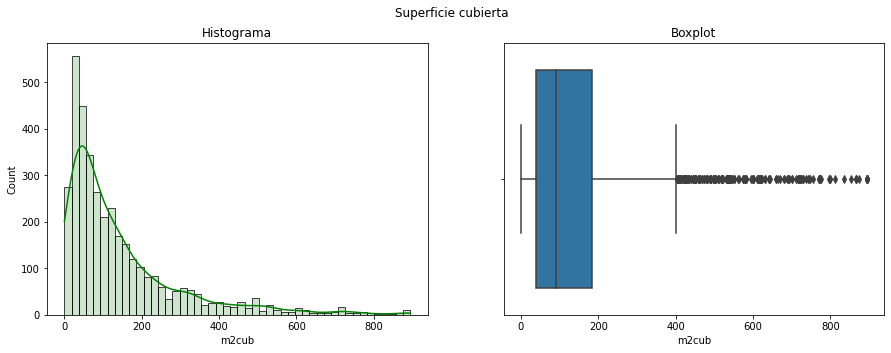

In [126]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Superficie cubierta')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['m2cub'], color='g', alpha = 0.2, kde = True)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['m2cub'])
axes[1].set_title("Boxplot")

#### Cantidad de ambientes

Text(0.5, 1.0, 'Boxplot')

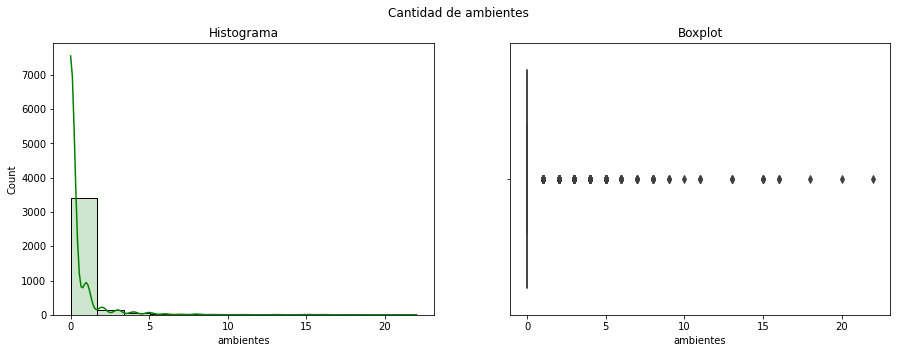

In [127]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Cantidad de ambientes')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['ambientes'], color='g', alpha = 0.2, kde = True)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['ambientes'])
axes[1].set_title("Boxplot")

In [128]:
data['ambientes'].value_counts()

0     3081
1      376
2       89
3       57
4       34
5       28
6       11
8        9
7        6
15       4
13       3
11       3
9        3
16       3
20       1
10       1
22       1
18       1
Name: ambientes, dtype: int64

#### Cantidad de baños

Text(0.5, 1.0, 'Boxplot')

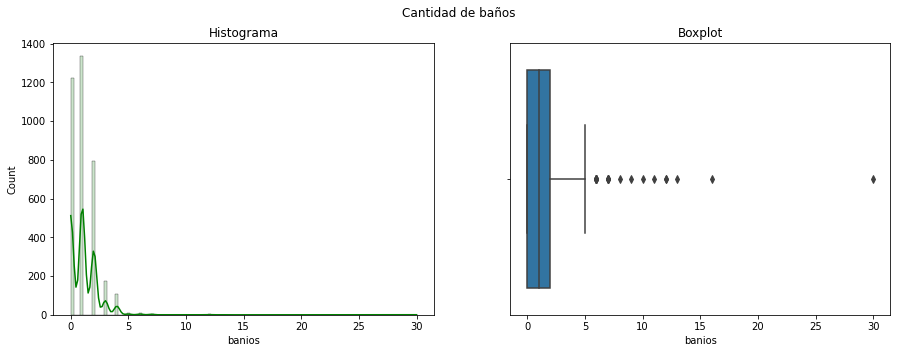

In [129]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Cantidad de baños')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['banios'], color='g', alpha = 0.2, kde = True)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['banios'])
axes[1].set_title("Boxplot")

In [130]:
geo_data['banios'].value_counts()

1     1337
0     1224
2      795
3      174
4      107
5        9
6        9
7        6
12       2
9        1
30       1
10       1
13       1
11       1
16       1
8        1
Name: banios, dtype: int64

<AxesSubplot:ylabel='count'>

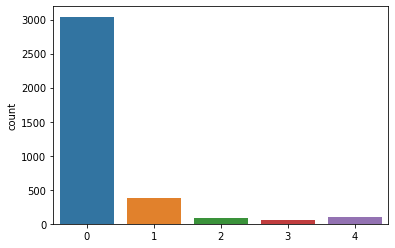

In [131]:
banios = []
for i in geo_data["ambientes"]:
  if i == 0:
    banios.append(0)
  if i == 1:
    banios.append(1)
  if i == 2:
    banios.append(2)
  if i == 3:
    banios.append(3)
  if i > 3:
    banios.append(4)
    
sns.countplot(x=banios)

#### Barrios

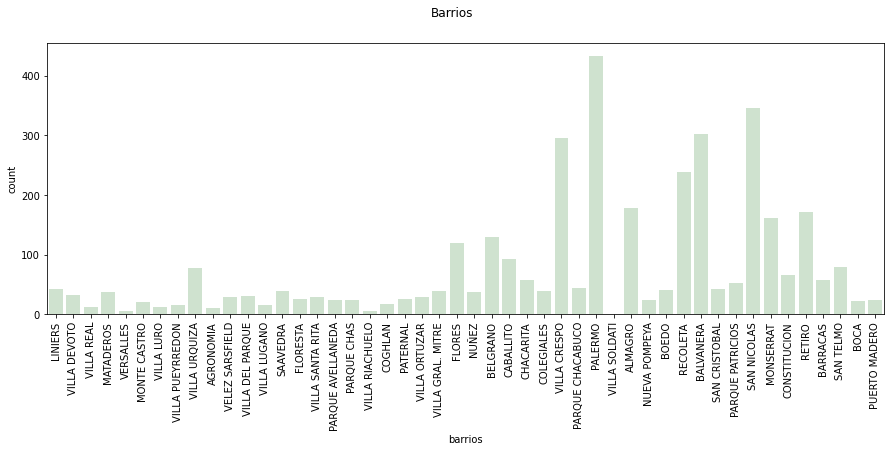

In [132]:
fig, axes = plt.subplots(1, 1, figsize=(15, 5))
fig.suptitle('Barrios')

# Histograma
sns.countplot(x = geo_data['barrios'], color='g', alpha = 0.2)
axes.tick_params(axis='x', rotation=90)

#### Comunas

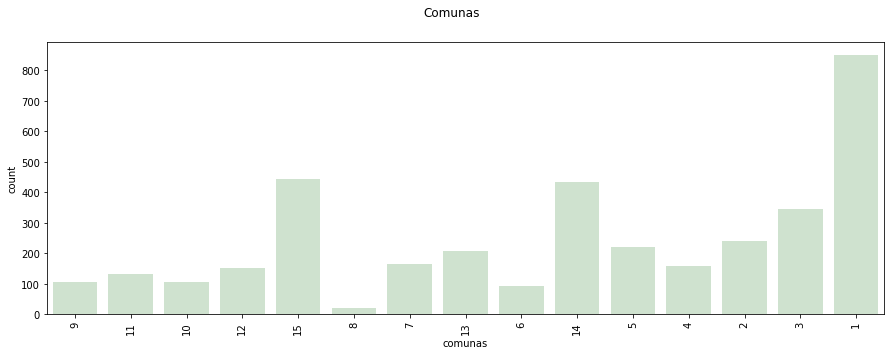

In [133]:
fig, axes = plt.subplots(1, 1, figsize=(15, 5))
fig.suptitle('Comunas')

# Histograma
sns.countplot(x = geo_data['comunas'], color='g', alpha = 0.2)
axes.tick_params(axis='x', rotation=90)

#### Precio

Text(0.5, 1.0, 'Boxplot')

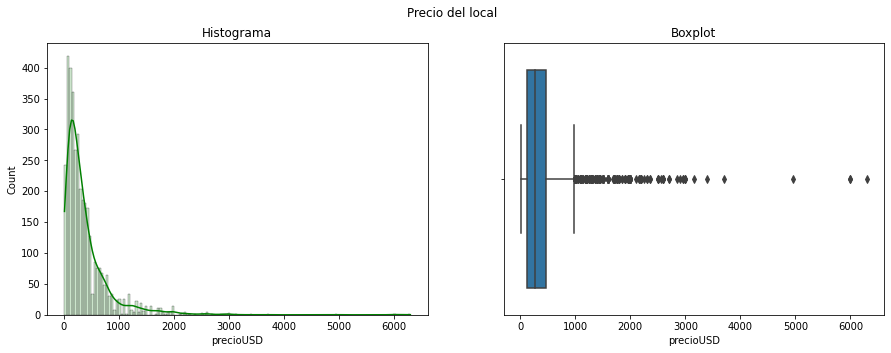

In [134]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Precio del local')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['precioUSD']/1000, color='g', alpha = 0.2, kde = True)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['precioUSD']/1000)
axes[1].set_title("Boxplot")

#### Precio del metro cuadrado

Text(0.5, 1.0, 'Boxplot')

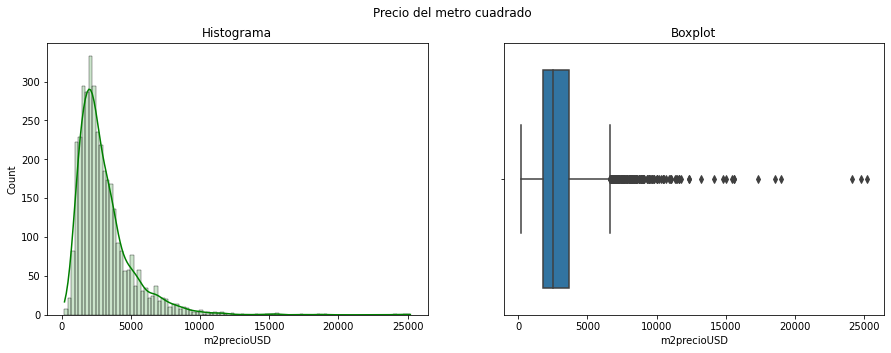

In [135]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Precio del metro cuadrado')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['m2precioUSD'], color='g', alpha = 0.2, kde = True)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['m2precioUSD'])
axes[1].set_title("Boxplot")

#### Distancia a las comisarias

Text(0.5, 1.0, 'Boxplot')

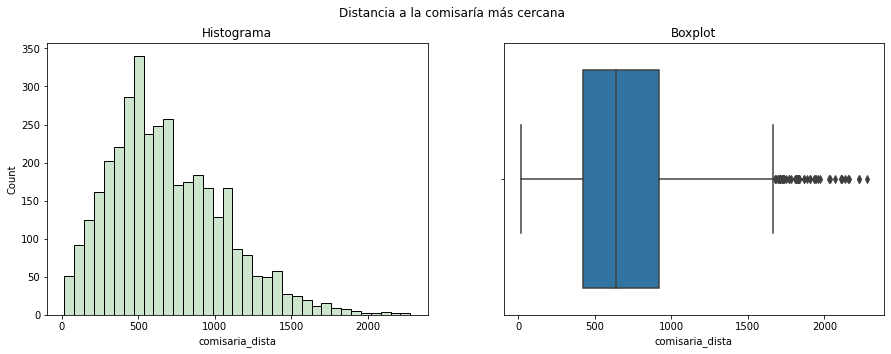

In [136]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Distancia a la comisaría más cercana')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['comisaria_dista'], color='g', alpha = 0.2)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['comisaria_dista'])
axes[1].set_title("Boxplot")

#### Distancia al Obelisco

Text(0.5, 1.0, 'Boxplot')

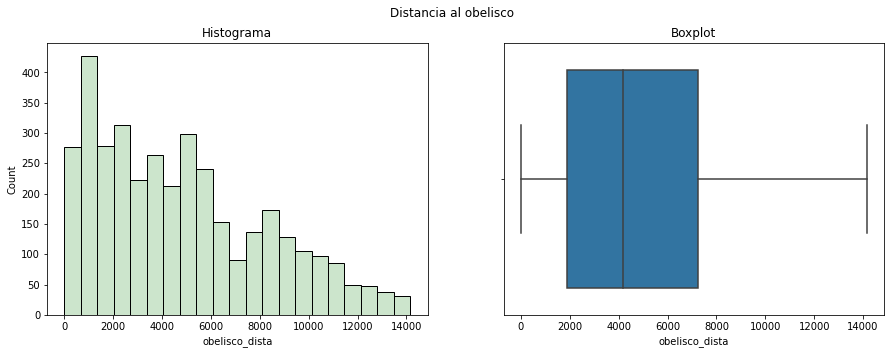

In [137]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Distancia al obelisco')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['obelisco_dista'], color='g', alpha = 0.2)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['obelisco_dista'])
axes[1].set_title("Boxplot")

#### Cantidad de robos

Text(0.5, 1.0, 'Boxplot')

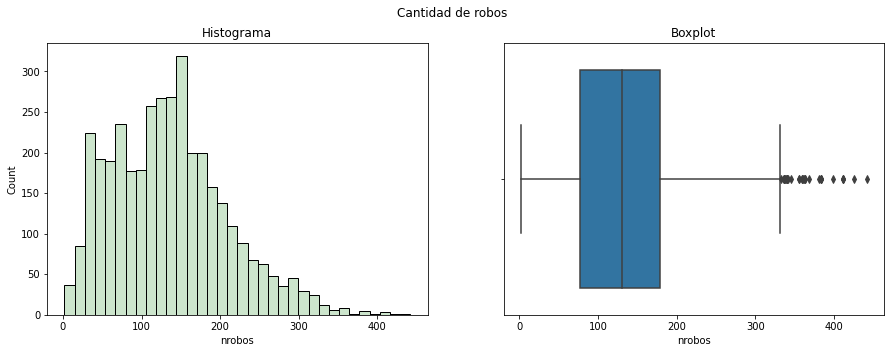

In [138]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Cantidad de robos')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['nrobos'], color='g', alpha = 0.2)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['nrobos'])
axes[1].set_title("Boxplot")

#### Superficie de espacios verdes

Text(0.5, 1.0, 'Boxplot')

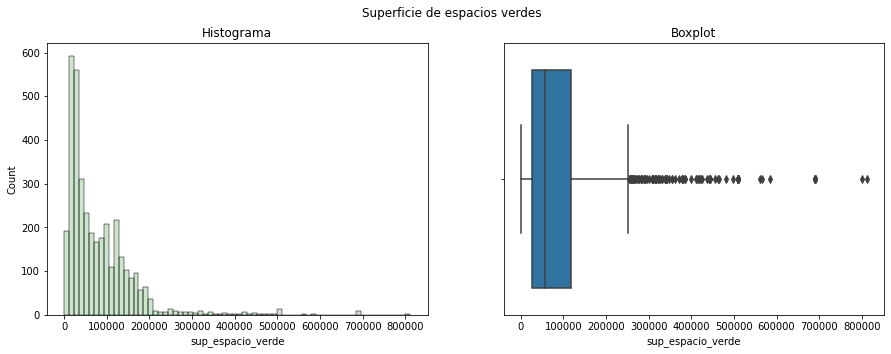

In [139]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Superficie de espacios verdes')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['sup_espacio_verde'], color='g', alpha = 0.2)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['sup_espacio_verde'])
axes[1].set_title("Boxplot")

#### Cantidad de espacios gastronomicos

Text(0.5, 1.0, 'Boxplot')

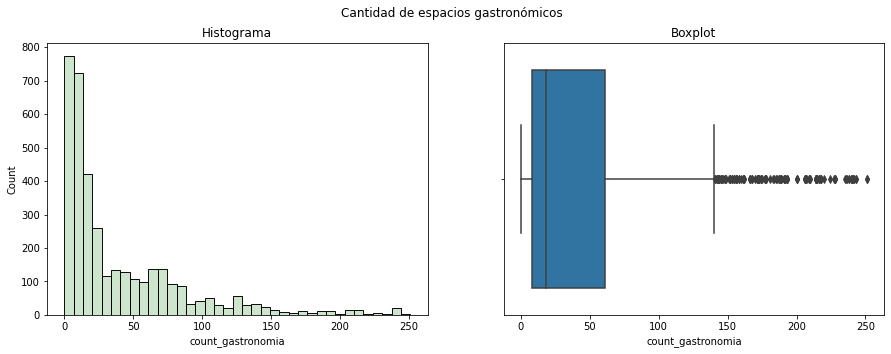

In [140]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Cantidad de espacios gastronómicos')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['count_gastronomia'], color='g', alpha = 0.2)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x = geo_data['count_gastronomia'])
axes[1].set_title("Boxplot")

#### Cantidad de espacios culturales

Text(0.5, 1.0, 'Boxplot')

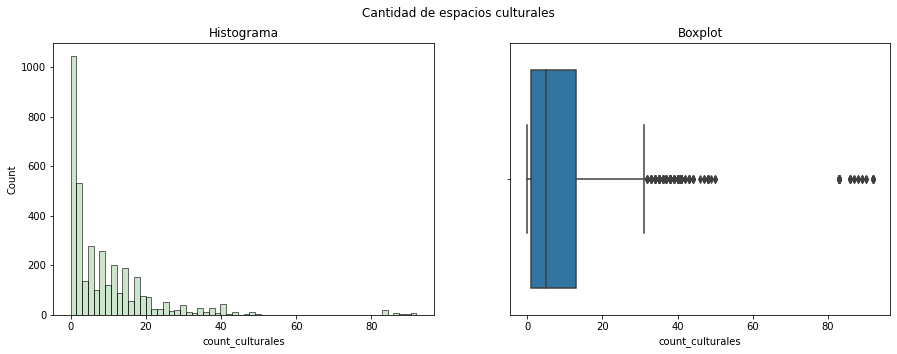

In [141]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Cantidad de espacios culturales')

# Histograma
sns.histplot(ax=axes[0], x = geo_data['count_culturales'], color='g', alpha = 0.2)
axes[0].set_title("Histograma")

# Boxplot
sns.boxplot(ax=axes[1], x=geo_data['count_culturales'])
axes[1].set_title("Boxplot")

### Análisis de variables numéricas

In [142]:
data_num = geo_data.select_dtypes(include = ['float64', 'int64'])
data_num = data_num.drop(['id', 'lat_planar', 'lon_planar'], axis = 1)
# Se guardan las variables numericas para renombrar el dataframe 
variables_numericas = data_num.columns
# Se transforma un GeoDataFrame a un Pandas DataFrame
data_num = pd.DataFrame(data_num.values)
data_num.columns = variables_numericas
data_num.head()

,antig,m2total,m2cub,ambientes,banios,latitud,longitud,precioUSD,m2precioUSD,comisaria_dista,obelisco_dista,nrobos,sup_espacio_verde,count_gastronomia,count_culturales,densidad_poblacional,densidad_viviendas
0,0.0,200.0,200.0,0.0,0.0,-34.639300,-58.528647,1500000.0,7500.000000,1162.621600,14053.797191,134.0,68426.445,12.0,0.0,9162.535077,3428.444997
1,30.0,50.0,50.0,0.0,1.0,-34.611807,-58.528138,125000.0,2500.000000,1887.227055,13473.139375,23.0,110997.543,3.0,0.0,8847.779056,3215.839159
2,30.0,414.0,414.0,0.0,2.0,-34.616468,-58.528111,590000.0,1425.120773,1497.020434,13514.662463,33.0,115341.039,5.0,0.0,8773.980909,3209.091367
3,35.0,414.0,414.0,0.0,2.0,-34.616344,-58.527918,730000.0,1763.000000,1506.066814,13495.631683,33.0,115500.289,5.0,0.0,8773.980909,3209.091367
4,35.0,285.0,285.0,0.0,1.0,-34.616344,-58.527918,550000.0,1929.000000,1506.066814,13495.631683,33.0,115500.289,5.0,0.0,8773.980909,3209.091367


In [143]:
data_num_corr = data_num.corr()['precioUSD'] 
golden_features_list = data_num_corr[abs(data_num_corr) > 0.2].sort_values(ascending=False)
print("There is {} strongly correlated values with precioUSD:\n{}".format(len(golden_features_list), golden_features_list))

There is 5 strongly correlated values with precioUSD:
precioUSD      1.000000
m2total        0.674698
m2cub          0.638539
m2precioUSD    0.341252
banios         0.213421
Name: precioUSD, dtype: float64


In [144]:
corr = data_num.corr() # We already examined SalePrice correlations
corr

,antig,m2total,m2cub,ambientes,banios,latitud,longitud,precioUSD,m2precioUSD,comisaria_dista,obelisco_dista,nrobos,sup_espacio_verde,count_gastronomia,count_culturales,densidad_poblacional,densidad_viviendas
antig,1.000000,0.058053,0.088165,0.069142,0.103795,-0.057807,0.049455,-0.034242,-0.112717,-0.035426,-0.061717,0.069820,0.005961,0.018962,0.017453,0.093323,0.089957
m2total,0.058053,1.000000,0.922581,0.159504,0.296723,-0.080384,0.100551,0.674698,-0.223322,0.030951,-0.085663,0.047135,0.024313,0.075160,0.100427,-0.050876,-0.045338
m2cub,0.088165,0.922581,1.000000,0.118175,0.332503,-0.068372,0.101174,0.638539,-0.211673,0.028613,-0.090569,0.055945,0.028252,0.084620,0.106721,-0.040683,-0.034678
ambientes,0.069142,0.159504,0.118175,1.000000,0.234055,0.030247,-0.009188,0.082385,-0.043844,0.022849,0.019334,-0.013218,-0.015582,0.006812,-0.021138,-0.029276,-0.023171
banios,0.103795,0.296723,0.332503,0.234055,1.000000,0.004354,0.048696,0.213421,-0.073962,0.025231,-0.057607,0.042335,0.004845,0.034408,0.069068,-0.006353,0.002097
latitud,-0.057807,-0.080384,-0.068372,0.030247,0.004354,1.000000,-0.088697,0.077083,0.255891,-0.066711,0.026521,-0.017045,0.050167,0.095059,0.063609,-0.023716,0.054979
longitud,0.049455,0.100551,0.101174,-0.009188,0.048696,-0.088697,1.000000,0.127952,0.058869,-0.440823,-0.960002,0.648045,0.272396,0.597016,0.485109,0.125378,0.172798
precioUSD,-0.034242,0.674698,0.638539,0.082385,0.213421,0.077083,0.127952,1.000000,0.341252,-0.018365,-0.119833,0.061391,0.071532,0.139535,0.110618,-0.069347,-0.046925
m2precioUSD,-0.112717,-0.223322,-0.211673,-0.043844,-0.073962,0.255891,0.058869,0.341252,1.000000,-0.073125,-0.065510,0.015022,0.068755,0.110286,0.066623,-0.036535,-0.001411
comisaria_dista,-0.035426,0.030951,0.028613,0.022849,0.025231,-0.066711,-0.440823,-0.018365,-0.073125,1.000000,0.434951,-0.442399,-0.067830,-0.330104,-0.226058,-0.148335,-0.159841


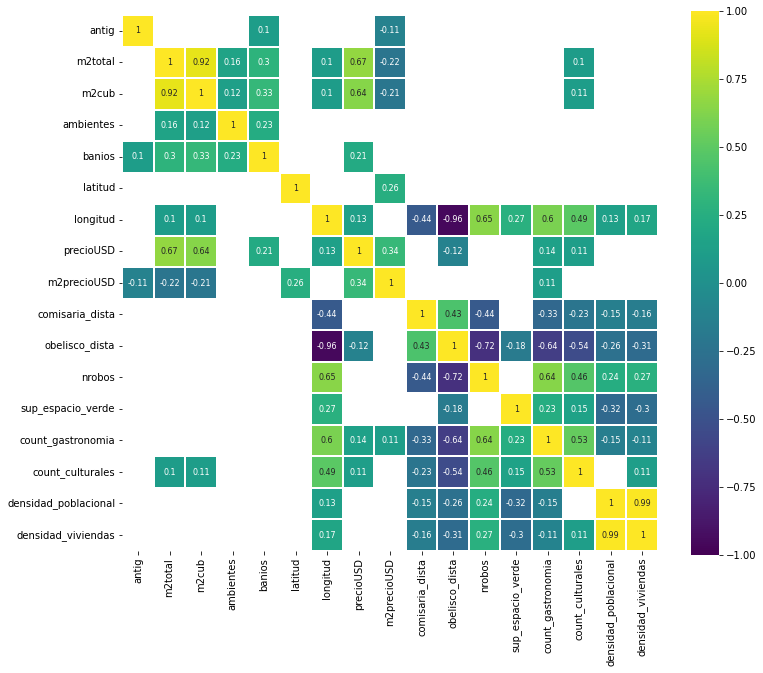

In [145]:
plt.figure(figsize=(12, 10))

sns.heatmap(corr[(corr >= 0.1) | (corr <= -0.1)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

### Analisis de variables catogeóricas - cuantitativas

#### Efecto de la antigüedad sobre el precio

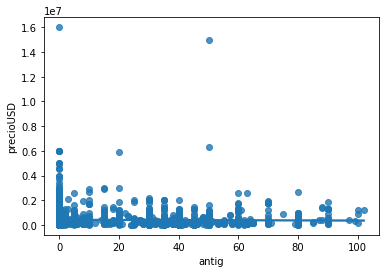

In [44]:
ax = sns.regplot(x="antig", y="precioUSD", data=geo_data)

#### Efecto de la superficie total sobre el precio

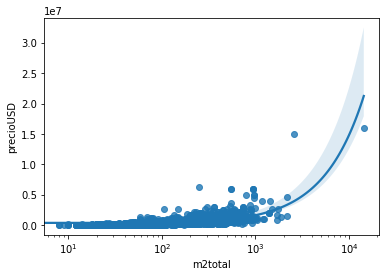

In [41]:
ax = sns.regplot(x="m2total", y="precioUSD", data=geo_data)
ax.set_xscale('log')

#### Efecto de la superficie cubierta sobre el precio

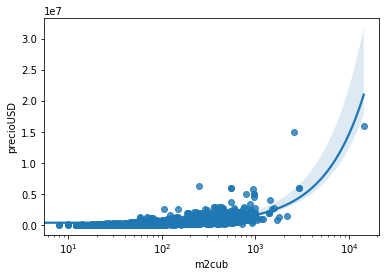

In [40]:
ax = sns.regplot(x="m2cub", y="precioUSD", data=geo_data)
ax.set_xscale('log')

#### Efecto de la cantidad de ambientes sobre el precio

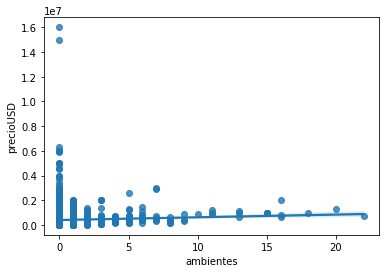

In [46]:
ax = sns.regplot(x="ambientes", y="precioUSD", data=geo_data)

#### Efecto de la cantidad de baños sobre el precio

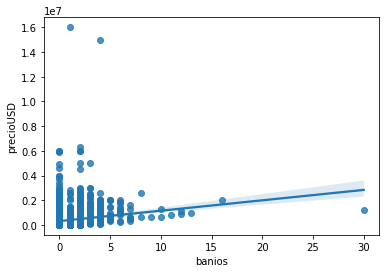

In [37]:
ax = sns.regplot(x="banios", y="precioUSD", data=geo_data)

#### Efecto del precio del m2 sobre el precio

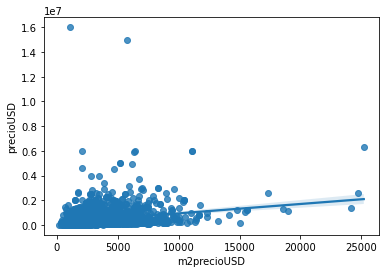

In [49]:
ax = sns.regplot(x="m2precioUSD", y="precioUSD", data=geo_data)

#### Efecto de la distancia a comisarias sobre el precio

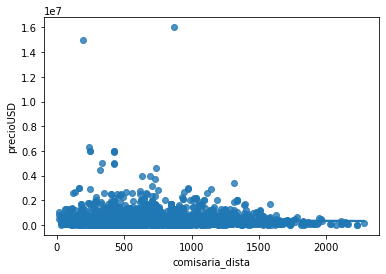

In [51]:
ax = sns.regplot(x="comisaria_dista", y="precioUSD", data=geo_data)

#### Efecto del número de robos sobre el precio

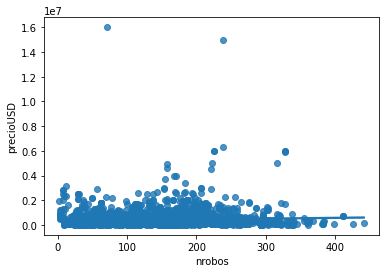

In [53]:
ax = sns.regplot(x="nrobos", y="precioUSD", data=geo_data)

#### Efecto de la superficie de espacios verdes sobre el precio

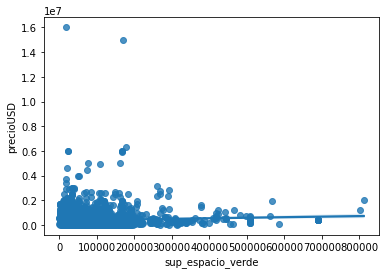

In [56]:
ax = sns.regplot(x="sup_espacio_verde", y="precioUSD", data=geo_data)

#### Efecto de la cantidad de locales culturales sobre el precio

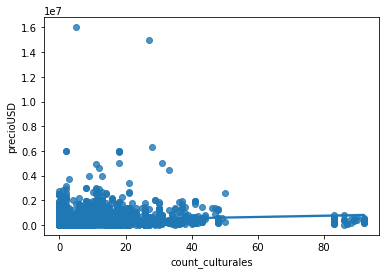

In [59]:
ax = sns.regplot(x="count_culturales", y="precioUSD", data=geo_data)

### Analisis de variables catogeóricas - cuantitativas

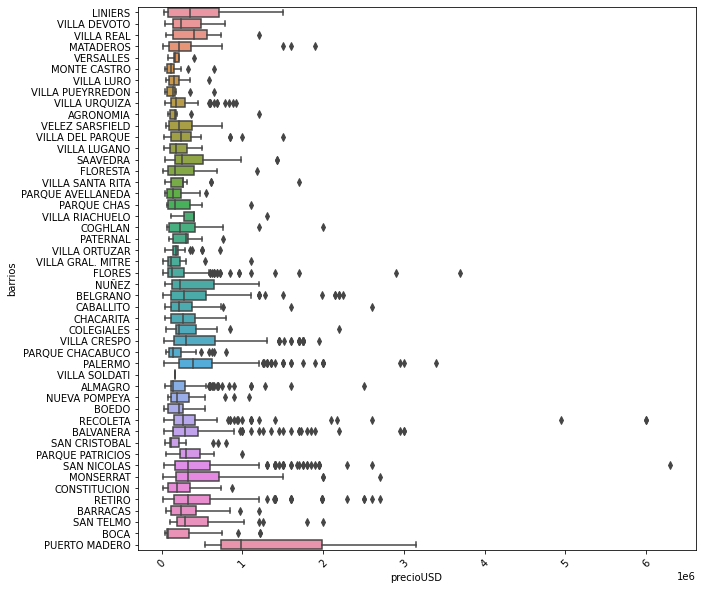

In [146]:
plt.figure(figsize = (10, 10))
ax = sns.boxplot(x='precioUSD', y='barrios', data=geo_data)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(rotation=45)
plt.show()

#### Variables cuantitativas vs Comunas

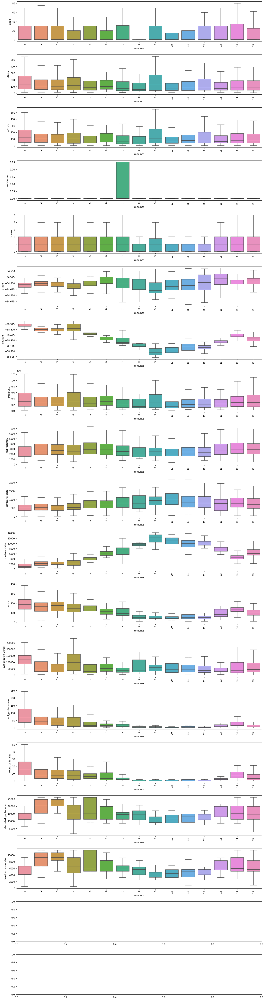

In [147]:
orden_comunas = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15']

fig, axes = plt.subplots(19, 1, figsize=(16, 60))

for i, ax in enumerate(fig.axes):
    if i < len(data_num.columns):
        sns.boxplot(y = data_num[data_num.columns[i]], x =  geo_data.comunas, order = orden_comunas,  ax=ax, showfliers=False)
        ax.tick_params(axis='x', rotation=90)
fig.tight_layout()

#### Variables cuantitativas vs Barrios

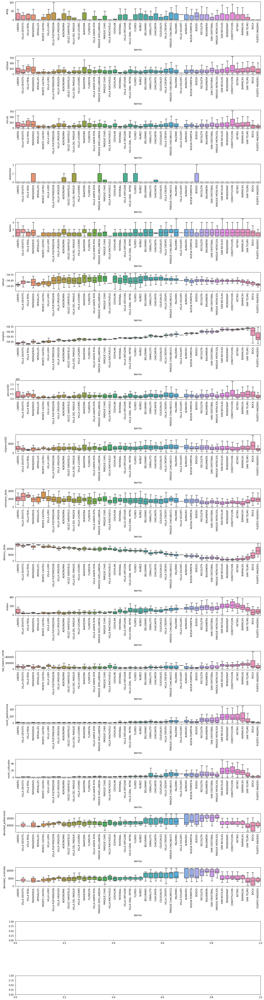

In [148]:
fig, axes = plt.subplots(19, 1, figsize=(16, 60))

for i, ax in enumerate(fig.axes):
    if i < len(data_num.columns):
        sns.boxplot(y = data_num[data_num.columns[i]], x = geo_data.barrios, ax=ax, showfliers=False)
        ax.tick_params(axis='x', rotation=90)
fig.tight_layout()

#### Evaluación de la densidad poblacion

In [154]:
censo.shape

(48, 3)

In [155]:
locales_barrio = pd.DataFrame(geo_data.groupby("barrios").count()['id']).reset_index()
locales_barrio = locales_barrio.rename(columns = {"id":"locales"})
censo_locales = pd.merge(barrios, locales_barrio, on = 'barrios')
censo_locales = censo_locales.sjoin(censo)
censo_locales.head()

,barrios,geometry,locales,index_right,densidad_poblacional,densidad_viviendas
0,CHACARITA,"MULTIPOLYGON (((-6506938.163 -4109112.260, -65...",58,2,19886.389012,8354.631273
1,PATERNAL,"MULTIPOLYGON (((-6508358.240 -4109189.214, -65...",26,2,19886.389012,8354.631273
2,VILLA CRESPO,"MULTIPOLYGON (((-6503702.432 -4109360.911, -65...",296,2,19886.389012,8354.631273
4,ALMAGRO,"MULTIPOLYGON (((-6502490.948 -4111563.952, -65...",179,2,19886.389012,8354.631273
5,CABALLITO,"MULTIPOLYGON (((-6504465.288 -4110607.810, -65...",93,2,19886.389012,8354.631273


In [156]:
censo_locales.corr()[['densidad_poblacional', 'locales']]

,densidad_poblacional,locales
locales,0.332493,1.000000
index_right,-0.401171,0.081522
densidad_poblacional,1.000000,0.332493
densidad_viviendas,0.988279,0.384223


<AxesSubplot:xlabel='densidad_poblacional', ylabel='locales'>

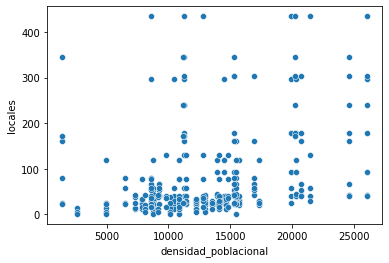

In [157]:
sns.scatterplot(data = censo_locales, x = 'densidad_poblacional', y = 'locales')

## Análisis exploratorio espacial

In [161]:
%matplotlib inline

import numpy
import pandas
import geopandas
# Graphics
from pysal.viz import splot
from splot.esda import plot_moran
from matplotlib import colors
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import tilemapbase
# Analysis
import pysal
import contextily
import libpysal
from pysal.explore import esda
from pysal.lib import weights
from libpysal.weights import Queen, Rook, KNN
from numpy.random import seed
from sklearn.cluster import DBSCAN
from pointpats import distance_statistics, QStatistic, random, PointPattern, centrography

In [159]:
!pip install tilemapbase

  Using cached tilemapbase-0.4.7.tar.gz (25 kB)
  Created wheel for tilemapbase: filename=tilemapbase-0.4.7-py3-none-any.whl size=25790 sha256=1f8f31086ade26bc7e986af60faad94d027260d3ababc8f1115d29a03f3b2157
  Stored in directory: /Users/alessiobocco/Library/Caches/pip/wheels/79/db/06/0c4ef9b4b444b45d69aa3859382e05dc5f5a777d2cfc16bffd
Successfully built tilemapbase


#### Ubicación de los locales

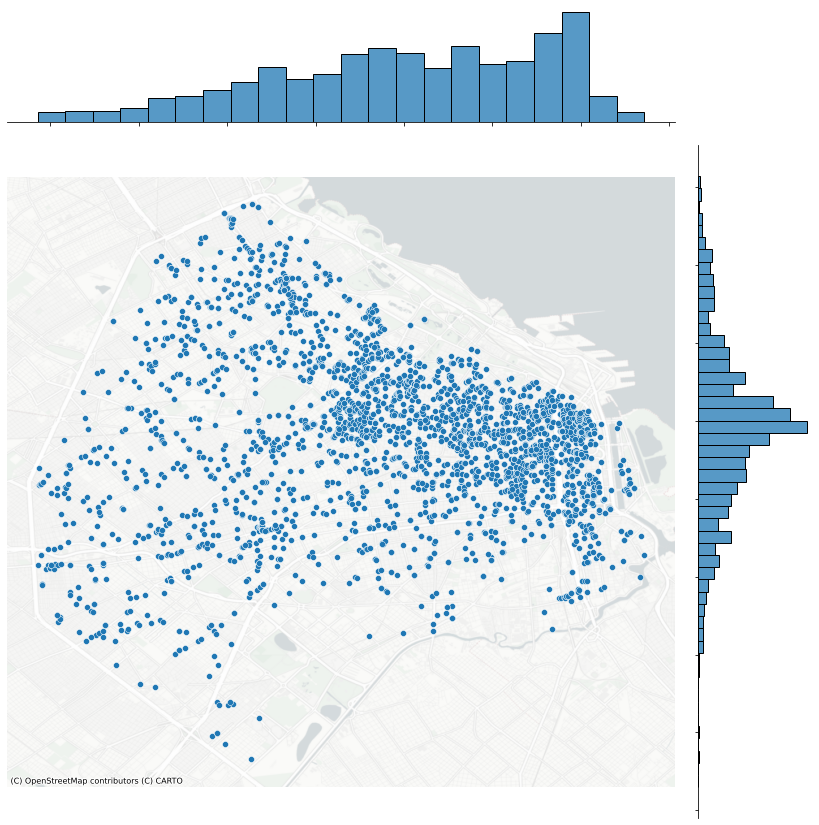

In [162]:
# Generate scatter plot
joint_axes = sns.jointplot(
    x='longitud', y='latitud', data=geo_data, height=12
)
# Add basemap
contextily.add_basemap(
    joint_axes.ax_joint,
    crs="EPSG:4326",
    source=contextily.providers.CartoDB.PositronNoLabels
)
# Clean axes
joint_axes.ax_joint.set_axis_off()
# Display
plt.show()

In [163]:
# Extentensión de los locales
bounding_box = [geo_data["geometry"].x.min(), geo_data["geometry"].x.max(), geo_data["geometry"].y.min(), geo_data["geometry"].y.max()]
# Cargar mapa base
tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(geo_data, buffer = 10)

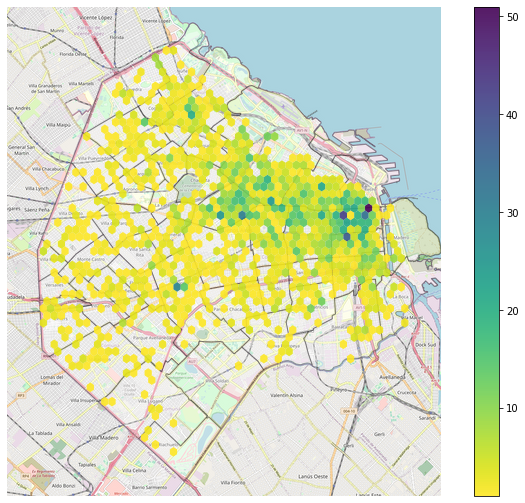

In [164]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(12, 9))

plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
barrios.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")

# Generate and add hexbin with 50 hexagons in each 
# dimension, no borderlines, half transparency,
# and the reverse viridis colormap
hb = ax.hexbin(
    x = geo_data["geometry"].x,
    y = geo_data["geometry"].y,
    gridsize=50, 
    linewidths=0,
    alpha=0.9, 
    cmap='viridis_r',
    mincnt=1
)

# Add colorbar
plt.colorbar(hb)
# Remove axes
ax.set_axis_off()

#### Densidad de locales 

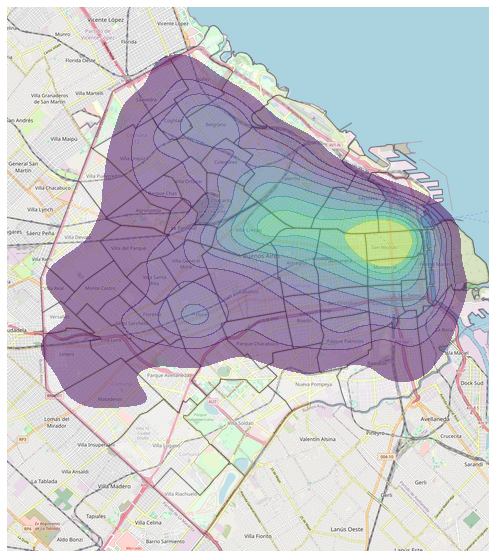

In [165]:
fig, ax = plt.subplots(figsize=(10,10))

plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
barrios.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
density_plot = sns.kdeplot(
                x = geo_data["geometry"].x,
                y = geo_data["geometry"].y,
                shade=True,
                alpha=0.5,
                cmap="viridis",
                #shade_lowest=False,
                thresh = 0.05
)

# Remove axes
ax.set_axis_off()

#### Centrografía

La centrografía es el análisis de la centralidad de un patrón de puntos. Por centraliad se refiere a la ubicación general de la distribución de puntos y al patrón de dispersión. Si el hexabin podría considerarse como un histograma espacial, la centragrafía sería el equivalente espacial a las medidas de tendencia central como la media o mediana y a las medidas de dispersión. Estas medidas son útiles ya que permiten resumir la distribución espacial de un único punto. Existen muchos indices en centragrafía para caracterizar el patrón de puntos y describir cuán compacto es alrededor de su centro de masa o cuán irregular es su forma. 

##### Posición

In [166]:
# Calculo de la media y mediana del patrón de puntos
mean_center = centrography.mean_center(geo_data[['lon_planar', 'lat_planar']])
med_center = centrography.euclidean_median(geo_data[['lon_planar', 'lat_planar']])

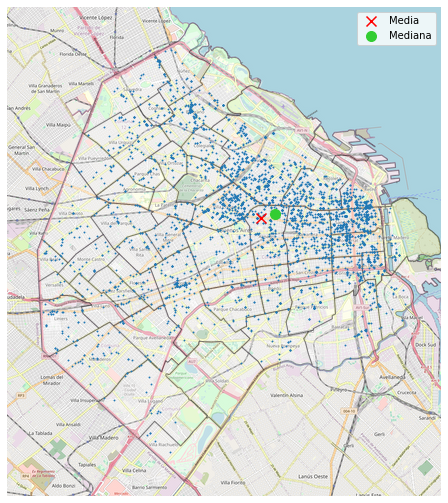

In [167]:
# Preparar girua
f, ax = plt.subplots(1, figsize=(12, 9))

# Agregar mapa base
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
# Agregar barrios
barrios.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
# Agregar locales
ax.scatter(geo_data['lon_planar'], geo_data['lat_planar'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Media', s = 100, zorder = 10)
# Agregar medidas de pocisión
ax.scatter(*med_center, color='limegreen', marker='o', label='Mediana', s = 100, zorder = 10)


# Agregar leyenda
ax.legend()
# Quitar ejex
ax.set_axis_off()
# Mostrar figura
plt.show()

##### Dispersión

In [168]:
major, minor, rotation = centrography.ellipse(geo_data[['lon_planar','lat_planar']])

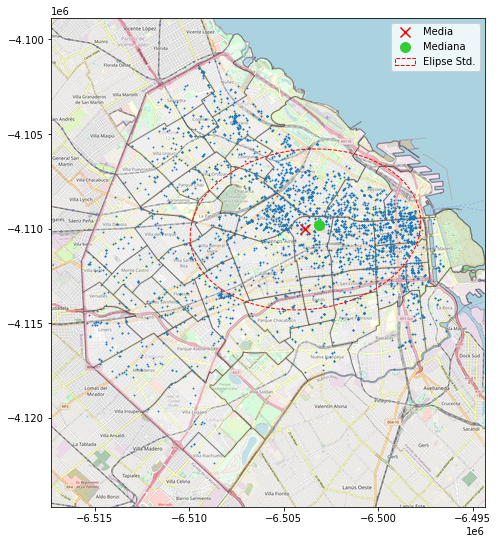

In [169]:
# Preparar girua
f, ax = plt.subplots(1, figsize=(12, 9))

# Agregar mapa base
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
# Agregar barrios
barrios.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
# Plot photograph points
# Agregar locales
ax.scatter(geo_data['lon_planar'], geo_data['lat_planar'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Media', s = 100, zorder = 10)
# Agregar medidas de pocisión
ax.scatter(*med_center, color='limegreen', marker='o', label='Mediana', s = 100, zorder = 10)

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                  width=major*2, # centrography.ellipse only gives half the axis
                  height=minor*2, 
                  angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                  facecolor='none', 
                  edgecolor='red', linestyle='--',
                  label='Elipse Std.')
ax.add_patch(ellipse)

ax.legend()
# Display
# Display
plt.show()

#### Aleatoriedad y clustering

In [170]:
# Crear array con las coordenadas planares
coordinates = geo_data[['lon_planar', 'lat_planar']].values

In [171]:
# Crear puntos aleatorios a partir de los datos
# Se repeta la distribución de los datos originales

alpha_shape, alpha, circs = libpysal.cg.alpha_shape_auto(coordinates, return_circles=True)

random_pattern_ashape = random.poisson(alpha_shape, size=len(coordinates))

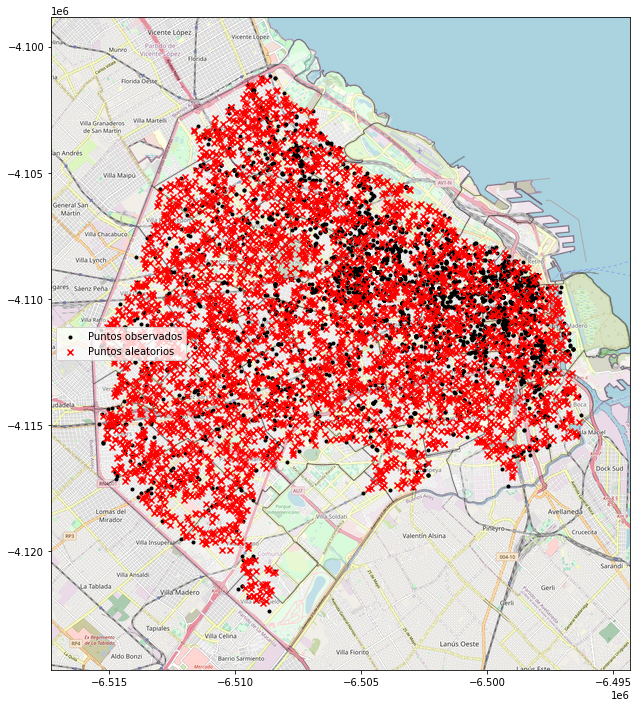

In [172]:
f,ax = plt.subplots(1, figsize=(12, 12))

# Agregar mapa base
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
# Agregar barrios
barrios.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")

plt.scatter(*coordinates.T, color='k', marker='.', label='Puntos observados')
plt.scatter(*random_pattern_ashape.T, color='r', marker='x', label='Puntos aleatorios')

ax.legend(ncol=1, loc='center left')
plt.show()

Los puntos se pueden analizar para comporbar si su distribución es el azar o no. Esto es importante porque algunas técnicas espaciales asumen que los datos surgen de procesos estocásticos. 

La prueba usada es similar al Chi-cuadrado. Se realizar una cuadrícula y se evalúan las proporciones de puntos dentro de cada cuadrante y se lo compara con una distribución al azar. 

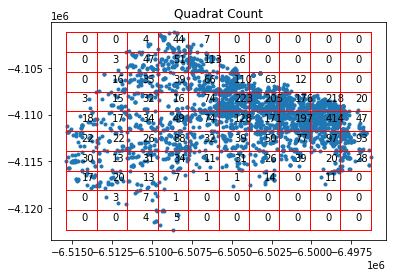

El p-valor de la prueba es 0.0


In [173]:
qstat = QStatistic(coordinates, nx = 10, ny = 10)
qstat.plot()

print("El p-valor de la prueba es", qstat.chi2_pvalue)

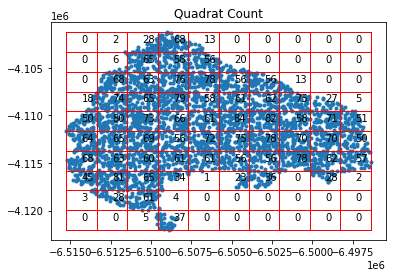

El p-valor de la prueba es 0.0


In [174]:
qstat_null = QStatistic(random_pattern_ashape, nx = 10, ny = 10)
qstat_null.plot()

print("El p-valor de la prueba es", qstat_null.chi2_pvalue)

Dado que los p-valores de ambas pruebas son menos a 0.05 se puede concluir que dentro del área en estudio, el patrón espacial es completamene aleatorio.  

Un segundo grupo de estadísticos espaciales consideran la distribución de dos métricas en el patrón de puntos: diastancia de los vecinos más cercanos y "huecos" dentro del patrón de puntos. Para ver más detalles se sugiere ver Ripley (1991) donde se describe cómo caracterizar agrupamientos o co-localizaciones en el patrón de puntos. 

El primer tipo estadístico usado en el presente trabajo es la fución G de Ripley que se centra en la distribución de las distancias a los vecinos más cercanos. Es decir, la función G resume las distancias entre cada punto en el patrón y su vecino más cercano. La función contempla la proporción de puntos que son considerados vecinos más cercanos de cada observación dentro de una determinada distancia del mismo. Luego acumula la porpoción de vecinos a medida que se aumenta el radio al rededor de cada punto. La distribución del porcentaje acumulado tiene una forma característica cuando el proceso espacial es completamente aleatorizado. La lógica tras esta función es la siguiente: se puede conocer cuando similar es el patrón de puntos en comparación a uno aleatorio al comparar la distribución acumulada de los vecinos más cercanos a medida que aumenta la distancia. Al comparar la distribución empírica con patrones simulados que tienen una distribución espacial conocida es posible hacer un contraste. Usualmente el proceso espacial usado como referencia es uno Poisson. 

In [175]:
g_test = distance_statistics.g_test(
    coordinates, support=40, keep_simulations=True
)

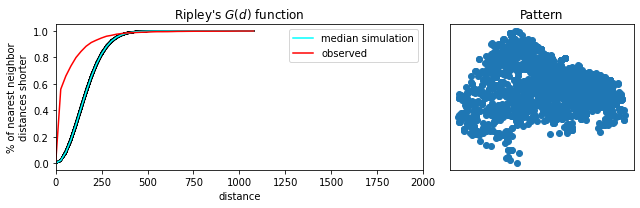

In [176]:
f,ax = plt.subplots(1,2,figsize=(9,3), 
                    gridspec_kw=dict(width_ratios=(6,3)))
# plot all the simulations with very fine lines
ax[0].plot(g_test.support, g_test.simulations.T, color='k', alpha=.01)
# and show the average of simulations
ax[0].plot(g_test.support, numpy.median(g_test.simulations, axis=0), color='cyan', 
         label='median simulation')


# and the observed pattern's G function
ax[0].plot(g_test.support, g_test.statistic, label = 'observed', color='red')

# clean up labels and axes
ax[0].set_xlabel('distance')
ax[0].set_ylabel('% of nearest neighbor\ndistances shorter')
ax[0].legend()
ax[0].set_xlim(0,2000)
ax[0].set_title(r"Ripley's $G(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title('Pattern')
f.tight_layout()
plt.show()

Un patrón agrupado debería tener una mayor cantidad de puntos cercanos entre sí en comparación a uno más "disperso", mientras que un proceso aleatoria estaría en algún punto intermedio. Por lo tanto, si la función 𝐺 aumenta rápidamente con la distancia, probablemente se trata de un patrón agrupado en clsuters. Se aumenta lentamente con la distancia, se trataría de un patrón disperso. 

En el gráfico de la izquierda se muestra la G(d), la distancia entre puntos se muestra en el eje x y la fracción de distancias entre vecinos menores al umbral _d_. La curva azul corresponde a la mediana de las _n_ simulaciones de un proceso espacial conocido. La curva roja, mientras tanto, corresponde a la función empírica calculada a partir de los datos. Dado que la roja aumenta con más rapiez que las simulaciones, se puede concluir que la distribución de los locales es más próxima entre ellos que lo que sería si se tratase de una distribución completamente aleatorizada. El patrón de puntos está agrupado. 

Cabe mencionar que este agrupamiento tiene que ver sólo con la ubicación espacial y no con los atributos de cada punto. 

La segunda función usada para caracterizar al patrón espacial de puntos es la función 𝐹 de Ripley. Mientras que la función 𝐺 se centra en las distancias entre puntos dentro del patrón, la 𝐹 analiza la distancia a los puntos desde los distintos espacios vaciós del patrón. Esto que también se conozca a la función 𝐹 como la función de espacios vaciós dado que caracteriza la distancia media desde puntos arbitrarios en los espacios vaciós al patrón de puntos. Más especificamente la funcion 𝐹 acumula, en un gradiente creciente de distancias, el porcentaje de puntos que se pueden encontrar dentro de un rango de distancia y lo compara con el que se encontraría si el procesos fuese completamente aleatorizado. Si el patró tiene muchos "huecps" la tasa de crecimiento de la función 𝐹 será baja. Caso contrario ocurriría si el patrón es muy disperso. Para realizar el contraste se compara nuevamente la función 𝐹 de los datos observados vs la misma función calculada sobre un set de datos con un patrón conocido. 

In [177]:
f_test = distance_statistics.f_test(
    coordinates, support=40, keep_simulations=True
)

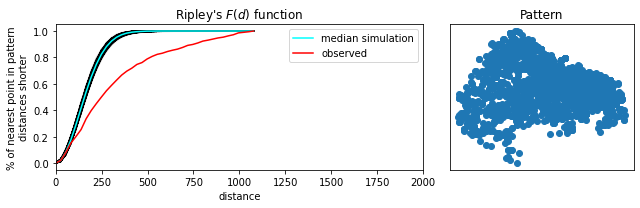

In [178]:
f,ax = plt.subplots(
    1,2,figsize=(9,3), gridspec_kw=dict(width_ratios=(6,3))
)

# plot all the simulations with very fine lines
ax[0].plot(f_test.support, f_test.simulations.T, color='k', alpha=.01)
# and show the average of simulations
ax[0].plot(f_test.support, numpy.median(f_test.simulations, axis=0), color='cyan', 
         label='median simulation')


# and the observed pattern's F function
ax[0].plot(f_test.support, f_test.statistic, label = 'observed', color='red')

# clean up labels and axes
ax[0].set_xlabel('distance')
ax[0].set_ylabel('% of nearest point in pattern\ndistances shorter')
ax[0].legend()
ax[0].set_xlim(0,2000)
ax[0].set_title(r"Ripley's $F(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title('Pattern')
f.tight_layout()
plt.show()

Dado que la función 𝐹 aumenta más lentamente que la función teórica, se podría concluir que los datos se encuentran agrupados

Al confirmar la presencia de grupos de datos, étos pueden identificarse mediante técnicas de clustering similares a las utilizadas durante la Diplomatura. Sin embargo, debe quedar claro que estos agrupamientos surgen de la posicion de los locales en el espacio y nada tiene que ver son las características discutidas en secciones anteriores. 

In [179]:
# Cantidad minima de puntos por cluster. En este caso 1%
minp = numpy.round(geo_data.shape[0] * 0.01)
minp

37.0

Desde el punto de vista de la técnica usada, DBSCAN, un cluster es una concentración de al menos _n_ puntos, cada uno dentro de una distancia _r_ de al menos otro punto dentro del cluster. Bajo esta premisa, el algortimo clasifica tres categorías:

* Ruido: puntos fuera del cluster.
* Núcleos: puntos dentro del cluster de al menos _m_ puntos dentro de la diatancia _r_. 
* Bordes: puntos dentro del cluster con menos _m_ puntos dentro de la distancia _r_. 

In [180]:
#  DBSCAN
clusterer = DBSCAN(eps = 500, min_samples = minp) # eps: distancia mínima en metros; min_samples: distancia minima entre puntos
# Fit to our data
clusterer.fit(geo_data[['lon_planar', 'lat_planar']])

DBSCAN(eps=500, min_samples=37.0)

In [181]:
# Cantidad 
len(clusterer.core_sample_indices_)

1624

Con esta configuracion se identificaron 1656 núcleos comerciales (centroides) alrededor de los cuales se agrupan los demás locales. La configuración del algortimo es basnte arbitraria y se necesataría de un experto en el domino para definir mejor las distancias y cantidad de observaciones por grupo. 

In [182]:
# Etiquetas de los tipo de datos
# -1: ruido
# 0: núcleo
# 1: borde
lbls = pandas.Series(clusterer.labels_, index=geo_data.index)

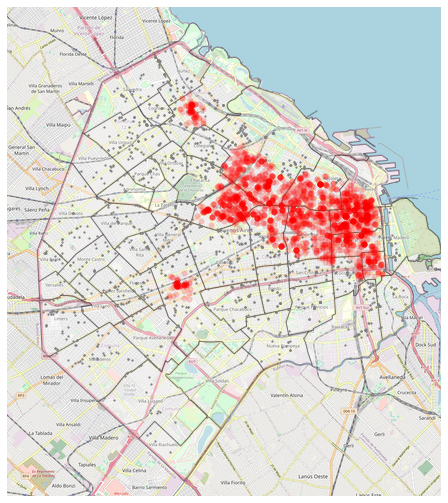

In [183]:
# Setup figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Agregar mapa base
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
# Agregar barrios
barrios.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")

# Quitar los puntos que no forman parte de ningún cluster (ruido)
noise = geo_data.loc[lbls==-1, ['lon_planar', 'lat_planar']]
# Graficar ruido en gris
ax.scatter(noise['lon_planar'], noise['lat_planar'], c='grey', s=5, linewidth=0)
# Graficar el rest de los puntos como miembros de un cluster
# Se toma la diferencia entre los índices de ruido y el resto de los datos
ax.scatter(geo_data.loc[geo_data.index.difference(noise.index), 'lon_planar'], \
           geo_data.loc[geo_data.index.difference(noise.index), 'lat_planar'], \
          c='red', linewidth=0, alpha = 0.2)

# Remove axes
ax.set_axis_off()
# Display the figure
plt.show()

Los puntos en rojos pertenecen a un cluster mientras que los grises son observaciones asiladas que no pertenecen a ninguno. Se observa como las áreas comerciales más importantes se ubican en el noreste de la ciudad y en proximidades a avenidas importantes. 

#### Variación espacial de las variables

##### Precio en USD

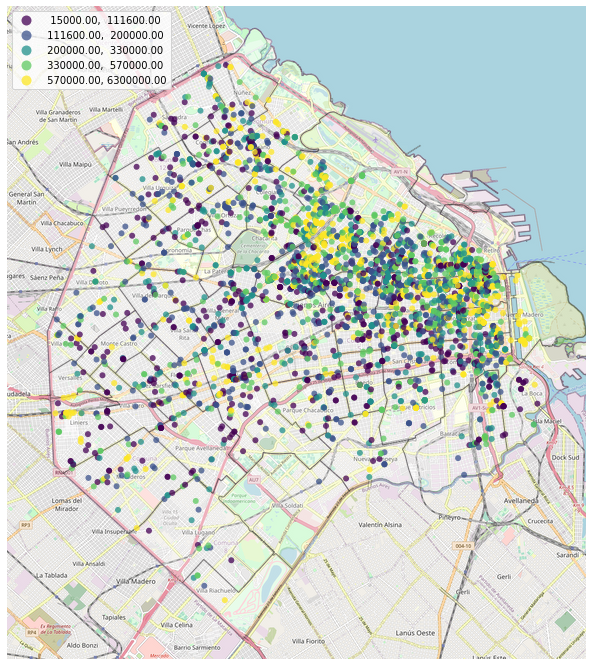

In [184]:
# Clasificacion por percentiles del precio de venta
f, ax = plt.subplots(1, figsize=(12, 12))

# Agregar mapa base
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
# Agregar barrios
barrios.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")

geo_data.plot(column='precioUSD', 
        cmap='viridis', 
        scheme='quantiles',
        k=5, 
        edgecolor='white', 
        linewidth=0., 
        alpha=0.75, 
        legend=True,
        legend_kwds={"loc": 2},
        ax=ax
       )

ax.set_axis_off()

In [185]:
# Calcular matriz de pesos espaciales
w = weights.KNN.from_dataframe(geo_data, k = 20)
# Row-standardization
w.transform = 'R'

In [186]:
def spatial_lagged_plot(geodataframe, variable, plot = True, results = False):
    # Nombre de la variable desplazada
    lagged_variable = variable + '_lag'
    # Nuevo data frame para guardar los datos
    geo_data_exploratory = pd.DataFrame()
    geo_data_exploratory['geometry'] = geodataframe['geometry']
    geo_data_exploratory[variable] = geodataframe[variable]
    geo_data_exploratory[lagged_variable] = weights.spatial_lag.lag_spatial(w, geodataframe[variable])
    geo_data_exploratory = geopandas.GeoDataFrame(geo_data_exploratory)
    
    # Graficar
    if plot:
        f, axs = plt.subplots(1, 2, figsize=(16, 10))
        ax1, ax2 = axs

        # Agregar mapa base
        plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
        plotter.plot(ax1)
        # Agregar barrios
        barrios.plot(ax=ax1, alpha=0.3, edgecolor="black", facecolor="white")
        geo_data_exploratory.plot(column = variable, cmap='viridis', scheme='quantiles',
                k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax1)
        ax1.set_axis_off()
        ax1.set_title(variable)


        # Agregar mapa base
        plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
        plotter.plot(ax2)
        # Agregar barrios
        barrios.plot(ax=ax2, alpha=0.3, edgecolor="black", facecolor="white")
        geo_data_exploratory.plot(column = lagged_variable, cmap='viridis', scheme='quantiles',
                k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax2)
        ax2.set_axis_off()
        ax2.set_title(lagged_variable)

        plt.show()
        
        # Devolver resultados en un GeoDataFrame
        if results:
            return(geo_data_exploratory)


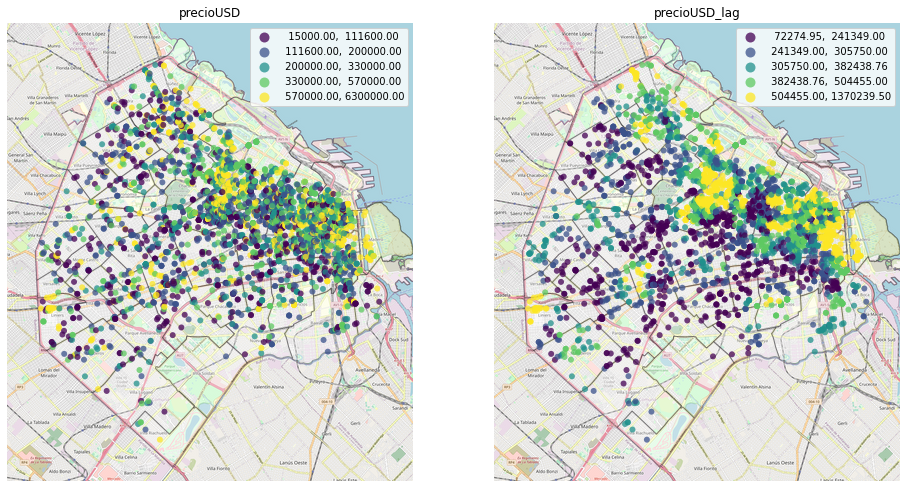

In [187]:
spatial_lagged_plot(geodataframe = geo_data, variable = 'precioUSD')

El mapa de quintiles de la variable espacial lag tiende a aumentar la impresión de similaridad entre valores en el espacio. En esencia se trata de un suavizado local. 

**Indice de Moran**

In [188]:
def moran_spot_map(geodataframe, variable, matriz_pesos, plot = True, hot = True):
    # Nombre de la variable desplazada
    lagged_variable = variable + '_lag'
    # Nuevo data frame para guardar los datos
    geo_data_exploratory = pd.DataFrame()
    geo_data_exploratory['geometry'] = geodataframe['geometry']
    geo_data_exploratory[variable] = geodataframe[variable]
    geo_data_exploratory[lagged_variable] = weights.spatial_lag.lag_spatial(matriz_pesos, geodataframe[variable])
    geo_data_exploratory = geopandas.GeoDataFrame(geo_data_exploratory)
    
    # Calculo del índice de Morán
    li = esda.moran.Moran_Local(geo_data_exploratory[variable], matriz_pesos)
    # Clases de resultados
    sig = li.p_sim < 0.05
    hotspot = sig * li.q==1
    coldspot = sig * li.q==3
    doughnut = sig * li.q==2
    diamond = sig * li.q==4
    
    if hot:
        # Caracterizar los puntos
        spots = ['n.sig.', 'hot spot']
        labels = [spots[i] for i in hotspot*1]
        # Escala de colores
        hmap = colors.ListedColormap(['red', 'lightgrey'])
    else:
        spots = ['n.sig.', 'cold spot']
        labels = [spots[i] for i in coldspot*1]
        # Escala de colores
        hmap = colors.ListedColormap(['blue', 'lightgrey'])
    
    # Graficar 
    f, ax = plt.subplots(1, figsize=(12, 12))
     # Agregar mapa base
    plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.Carto_Dark, width=1000)
    plotter.plot(ax)
    # Agregar barrios
    barrios.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
    geo_data_exploratory.assign(cl=labels).plot(column='cl', categorical=True, \
            k=2, cmap=hmap, linewidth=0.01, ax=ax, \
            edgecolor='white', legend=True, alpha = 0.7)
    ax.set_axis_off()
    plt.show()
    

In [189]:
def moran_quadrants_map(geodataframe, variable, matriz_pesos, plot = True):
    # Nombre de la variable desplazada
    lagged_variable = variable + '_lag'
    # Nuevo data frame para guardar los datos
    geo_data_exploratory = pd.DataFrame()
    geo_data_exploratory['geometry'] = geodataframe['geometry']
    geo_data_exploratory[variable] = geodataframe[variable]
    geo_data_exploratory[lagged_variable] = weights.spatial_lag.lag_spatial(matriz_pesos, geodataframe[variable])
    geo_data_exploratory = geopandas.GeoDataFrame(geo_data_exploratory)
    
    # Calculo del índice de Morán
    li = esda.moran.Moran_Local(geo_data_exploratory[variable], matriz_pesos)
    # Clases de resultados
    sig = 1 * (li.p_sim < 0.05)
    hotspot = 1 * (sig * li.q==1)
    coldspot = 3 * (sig * li.q==3)
    doughnut = 2 * (sig * li.q==2)
    diamond = 4 * (sig * li.q==4)
    spots = hotspot + coldspot + doughnut + diamond
    
    spot_labels = [ '0 ns', '1 hot spot', '2 doughnut', '3 cold spot', '4 diamond']
    labels = [spot_labels[i] for i in spots]
    # Colores para cada clase
    hmap = colors.ListedColormap([ 'lightgrey', 'red', 'lightblue', 'blue', 'pink'])
    f, ax = plt.subplots(1, figsize=(12, 12))
         # Agregar mapa base
    plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.Carto_Dark, width=1000)
    plotter.plot(ax)
    # Agregar barrios
    barrios.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
    geodataframe.assign(cl=labels).plot(column='cl', categorical=True, \
            k=2, cmap=hmap, linewidth=0.1, ax=ax, \
            edgecolor='white', legend=True)
    ax.set_axis_off()
    plt.show()

Interpretación:

In [190]:
from IPython import display


In [191]:
![main]display.Image("/Users/alessiobocco/Downloads/a02g09.png")

zsh:1: missing end of string


Los puntos calientes y fríos se encuentran en los cuadrantres 1 (Alto en x - Alto en y) y en el cuadrante 3 (Bajo en x - Bajo en y), respectivamente. Esto quiere decir que locales caros están rodeados de locales caros y locales baratos están rodeados de locales baratos. Sin embargo, los cuadrantes 2 y 4 indicarían la presencia de outliers espaciales. Son puntos donde se rompen el patrón espacial. Cuando los valores altos de la variable están rodeados de valores bajos se trata de un diamante (diamond) y cuando sucede lo contrario de una dona (doughnut)

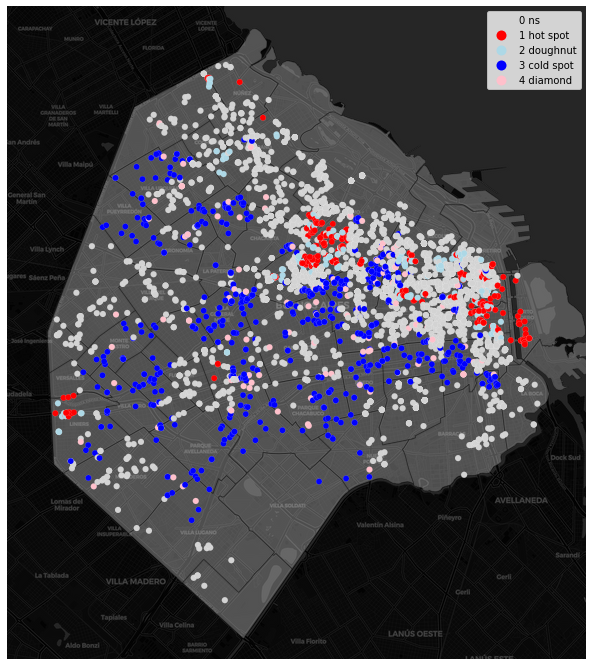

In [192]:
moran_quadrants_map(geodataframe = geo_data, variable = 'precioUSD', matriz_pesos = w)

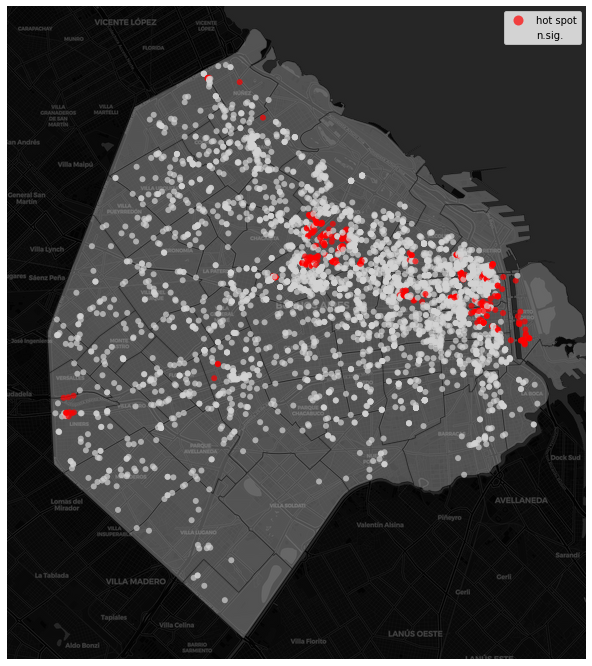

In [193]:
moran_spot_map(geodataframe = geo_data, variable = 'precioUSD', matriz_pesos = w, hot = True)

In [194]:
# Guardar resultados
geo_data.to_csv("./data/geo_data.csv")

In [195]:
geo_data.columns

Index(['id', 'antig', 'm2total', 'm2cub', 'ambientes', 'banios', 'latitud',
       'longitud', 'precioUSD', 'm2precioUSD', 'comisaria_dista',
       'obelisco_dista', 'nrobos', 'sup_espacio_verde', 'count_gastronomia',
       'count_culturales', 'geometry', 'lon_planar', 'lat_planar', 'calle',
       'altura', 'comunas', 'barrios', 'densidad_poblacional',
       'densidad_viviendas', 'distritos'],
      dtype='object')

In [196]:
geo_data.shape

(3670, 26)